In [1]:
import cv2
import numpy as np
from math import sqrt
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
%ll ../../data

total 564636
-rw-rw-r-- 1 fitiko 269118076 Jul 30 16:34 video_1.mp4
-rw-rw-r-- 1 fitiko 309059778 Jul 30 18:25 video_2.mp4


In [3]:
def plot_image(img, figsize=(24,16)):
    plt.close('all')
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img, cmap='gray')
    #ax.axis('off')
    plt.show()

In [4]:
def extract_frames_from_video(path, frames_steps=10):
    """ Returns a list of frames of input video """
    # Open video and get number of frames
    cap = cv2.VideoCapture(path)
    frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f'Frames in video: {frames}')
    
    # Frames to extract
    frames_list = [int(frames/frames_steps)*step
                   for step in range(frames_steps)]

    # Extract frames
    frames = list()
    for frame_n in frames_list:
        cap.set(1, frame_n)
        ret, frame = cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
    
    # Close video
    cap.release()
    return frames

In [5]:
frames = extract_frames_from_video('../../data/video_1.mp4')

Frames in video: 15750


In [6]:
raw_img = frames[0]

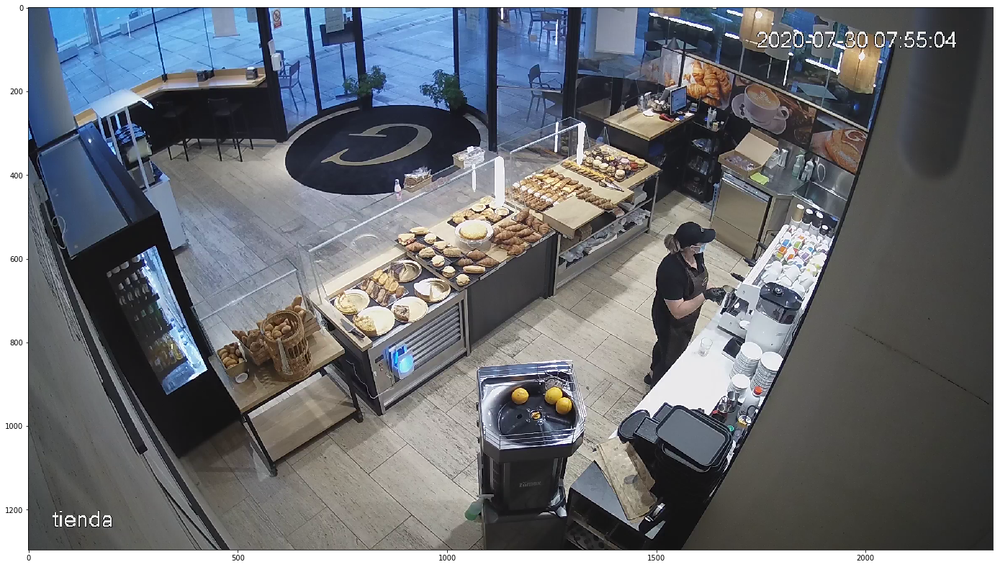

In [7]:
plot_image(raw_img)

### Crop mostrador step by step

In [8]:
vitr_pts = {'top-left': (840, 430),
            'top-right': (320, 1380),
            'bottom-left': (970, 510),
            'bottom-right': (390, 1510)}

In [9]:
img_pts = raw_img.copy()
for y, x in vitr_pts.values():
    # Radius of circle 
    radius = 3
    # Red color in RGB 
    color = (255, 0, 0) 
    # Line thickness of 2 px 
    thickness = 5
    # Using cv2.circle() method 
    img_pts = cv2.circle(img_pts, (x, y), radius, color, thickness) 

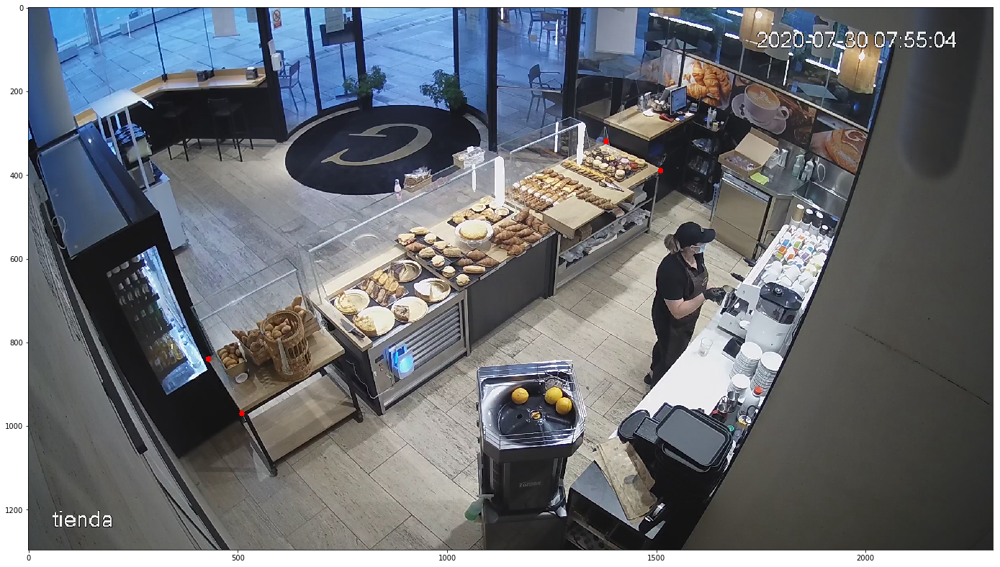

In [10]:
plot_image(img_pts)

In [11]:
a = vitr_pts['top-right'][1] - vitr_pts['top-left'][1]
b = vitr_pts['top-left'][0] - vitr_pts['top-right'][0]
width = round(sqrt(a**2 + b**2))

In [12]:
a = vitr_pts['top-left'][1] - vitr_pts['bottom-left'][1]
b = vitr_pts['bottom-left'][0] - vitr_pts['top-left'][0]
height = round(sqrt(a**2 + b**2))

In [13]:
print(f'Width: {width} - Height: {height}')

Width: 1083 - Height: 153


In [14]:
raw_pts = np.float32([[x, y] for y, x in vitr_pts.values()])

In [15]:
raw_pts

array([[ 430.,  840.],
       [1380.,  320.],
       [ 510.,  970.],
       [1510.,  390.]], dtype=float32)

In [16]:
dst_pts = np.float32([[0, 0], [width, 0],
                      [0, height], [width, height]])

In [17]:
dst_pts

array([[   0.,    0.],
       [1083.,    0.],
       [   0.,  153.],
       [1083.,  153.]], dtype=float32)

In [18]:
M = cv2.getPerspectiveTransform(raw_pts, dst_pts)

In [19]:
img_crop = cv2.warpPerspective(raw_img, M, (width, height))

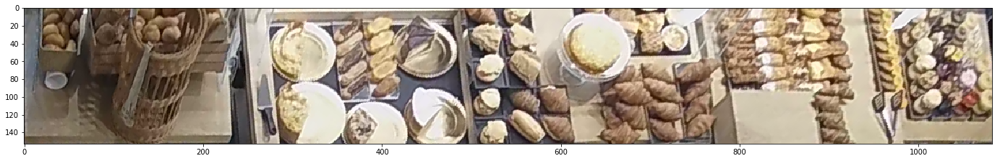

In [20]:
plot_image(img_crop)

In [21]:
div_lines_x = [240, 500, 770]

In [22]:
img_lines = img_crop.copy()
for x in div_lines_x:
    # Line coordinates
    start_point = (x, 0) 
    end_point = (x, img_lines.shape[0]) 
    # Red color in RGB
    color = (255, 0, 0) 
    # Line thicknes
    thickness = 2
    # Using cv2.line() method 
    img_lines = cv2.line(img_lines, start_point, end_point, color, thickness) 

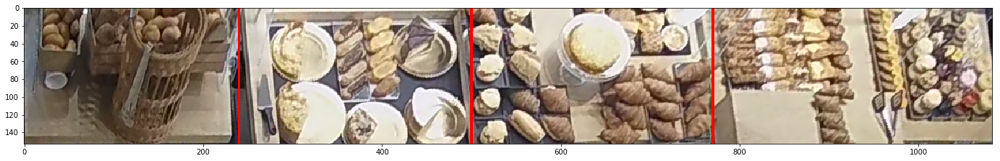

In [23]:
plot_image(img_lines)

In [24]:
vitr_crops = list()
for idx, x in enumerate(div_lines_x):
    if idx == 0:
        crop = img_crop[: , :x, :]
    elif idx == (len(div_lines_x) - 1):
        crop = img_crop[: , x:, :]
    else:
        crop = img_crop[: , div_lines_x[idx-1]:x]
    vitr_crops.append(crop)

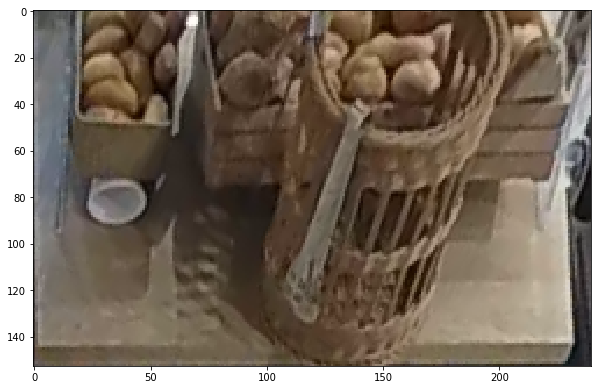

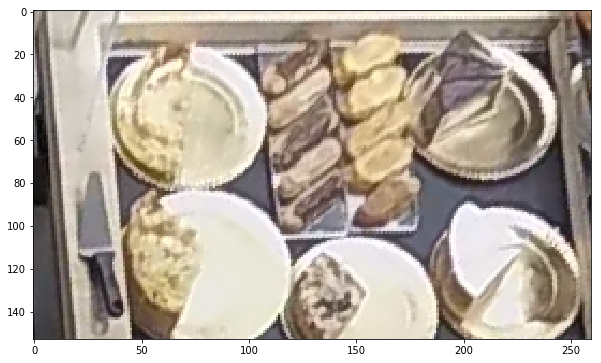

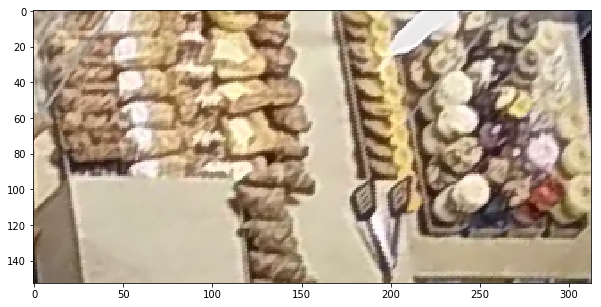

In [25]:
for vitr_img in vitr_crops:
    plot_image(vitr_img, figsize=(10, 10))

### Wrap up in a function

In [26]:
def extract_mostrador_imgs(img,
                           vitr_pts = {'top-left': (840, 430),
                                       'top-right': (320, 1380),
                                       'bottom-left': (970, 510),
                                       'bottom-right': (390, 1510)},
                           div_lines_x = [240, 500, 770]):
    # Calculate width - height
    a = vitr_pts['top-right'][1] - vitr_pts['top-left'][1]
    b = vitr_pts['top-left'][0] - vitr_pts['top-right'][0]
    width = round(sqrt(a**2 + b**2))
    
    a = vitr_pts['top-left'][1] - vitr_pts['bottom-left'][1]
    b = vitr_pts['bottom-left'][0] - vitr_pts['top-left'][0]
    height = round(sqrt(a**2 + b**2))
    
    # Crop image with warp perspective
    raw_pts = np.float32([[x, y] for y, x in vitr_pts.values()])
    dst_pts = np.float32([[0, 0], [width, 0],
                          [0, height], [width, height]])
    M = cv2.getPerspectiveTransform(raw_pts, dst_pts)
    img_crop = cv2.warpPerspective(img, M, (width, height))
    
    vitr_crops = list()
    for idx, x in enumerate(div_lines_x):
        if idx == 0:
            crop = img_crop[: , :x, :]
        elif idx == (len(div_lines_x) - 1):
            crop = img_crop[: , x:, :]
        else:
            crop = img_crop[: , div_lines_x[idx-1]:x]
        vitr_crops.append(crop)
    return img_crop, vitr_crops

Frame: 0


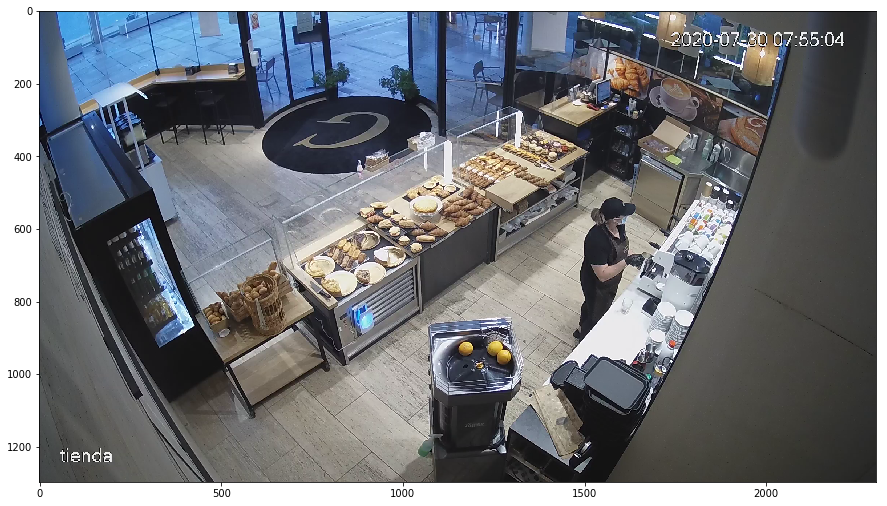

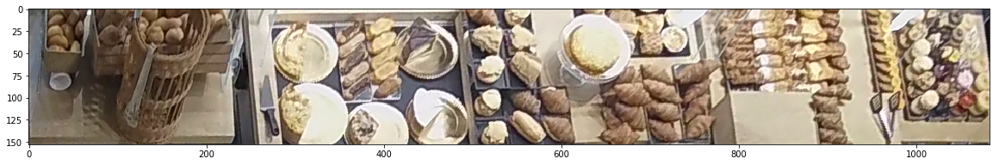

Frame: 1


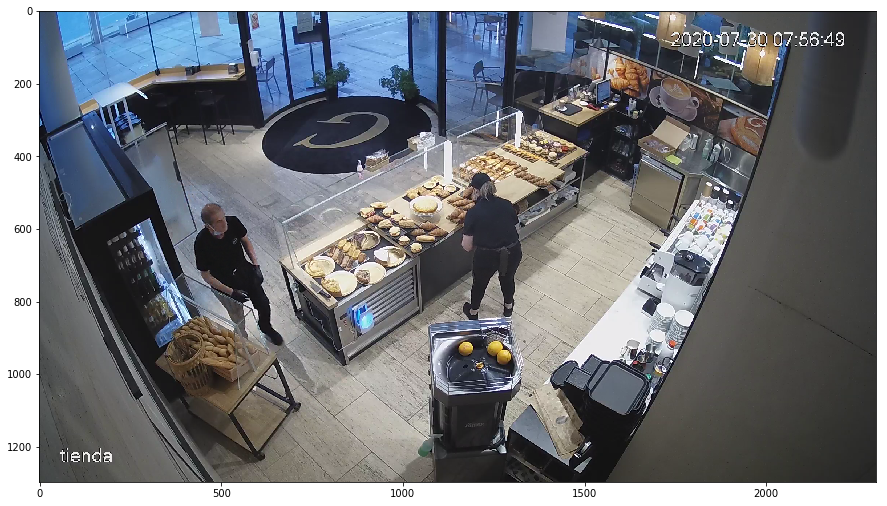

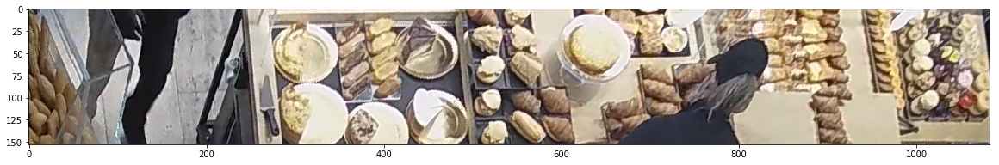

Frame: 2


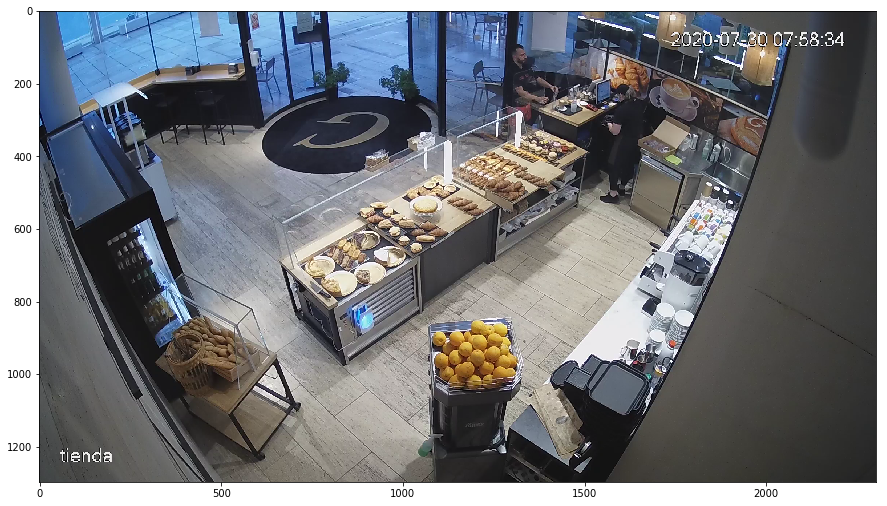

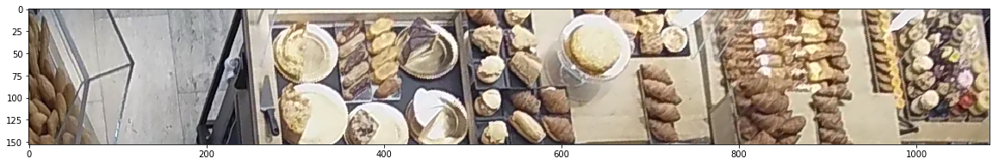

Frame: 3


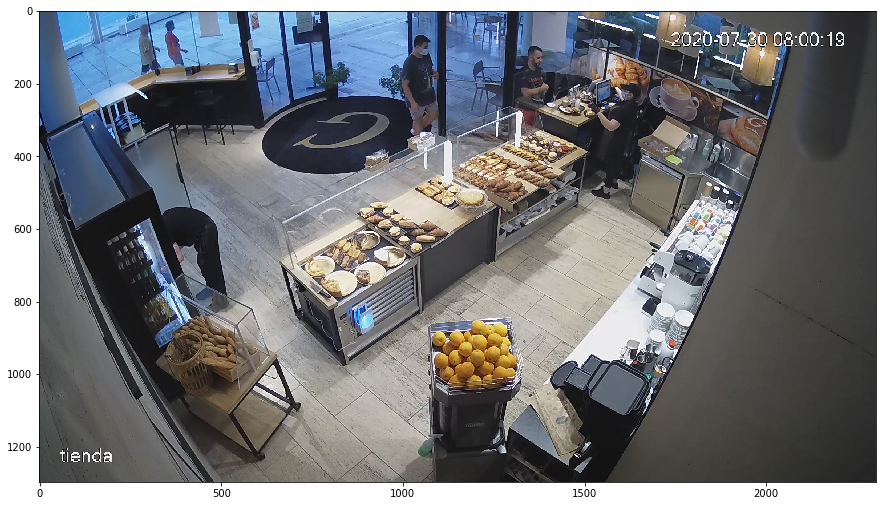

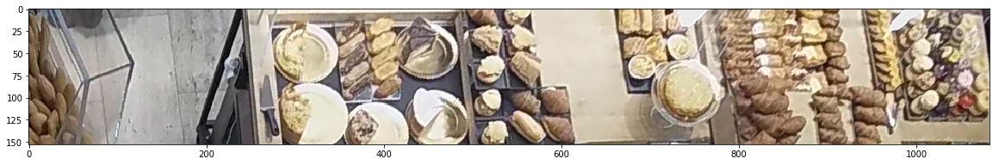

Frame: 4


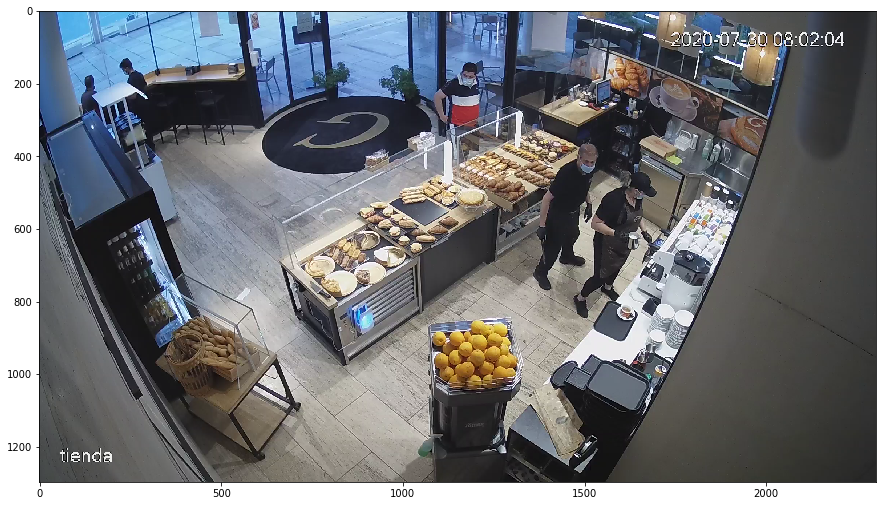

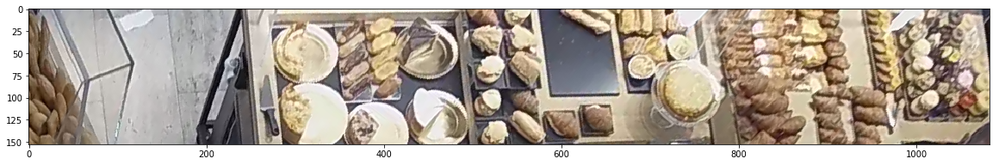

Frame: 5


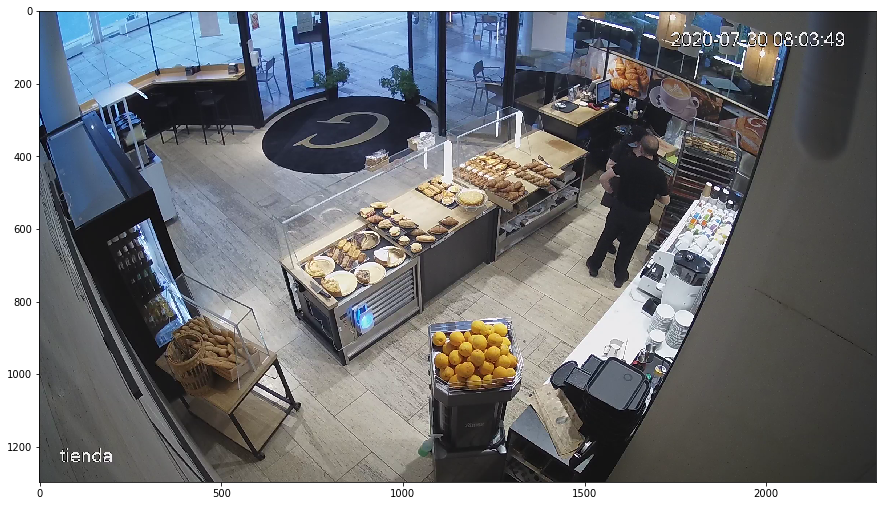

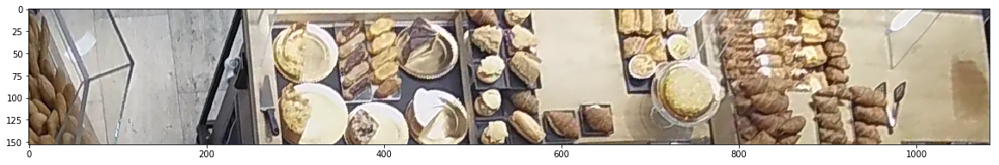

Frame: 6


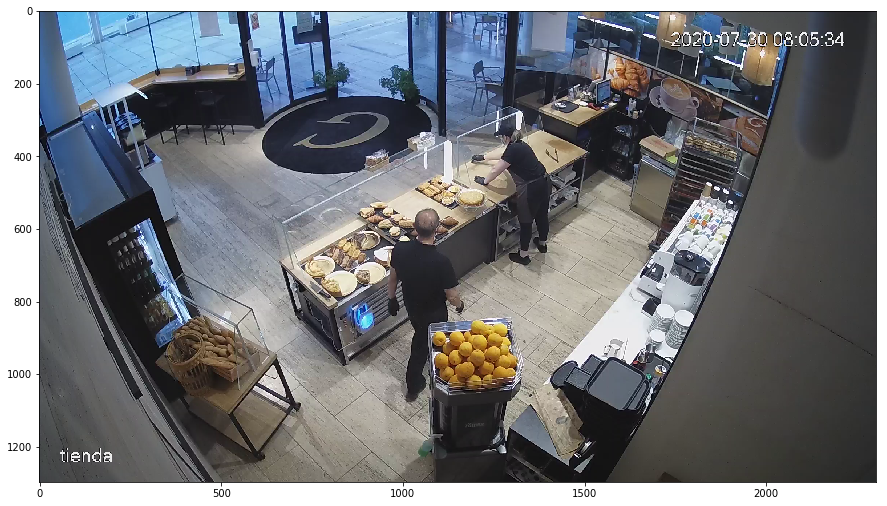

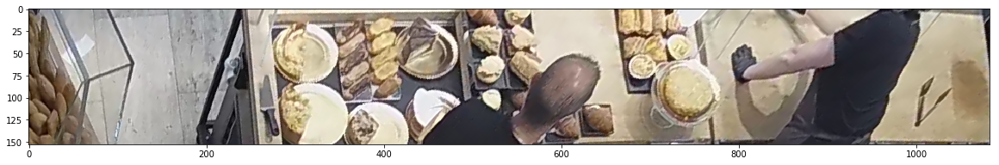

Frame: 7


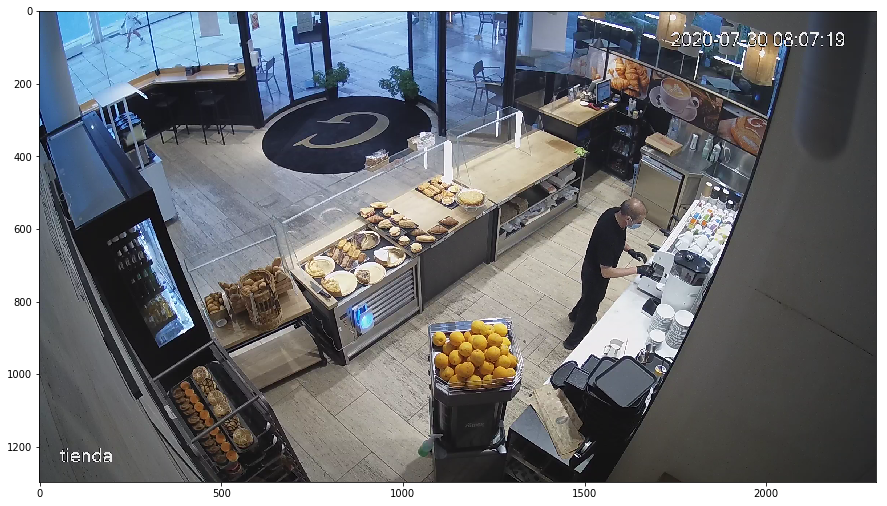

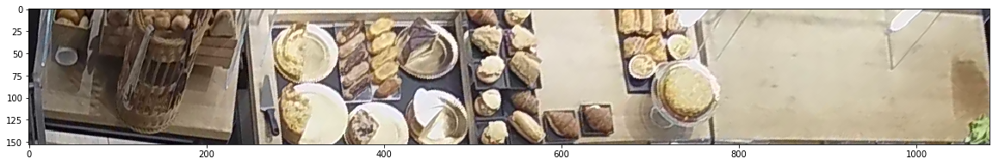

Frame: 8


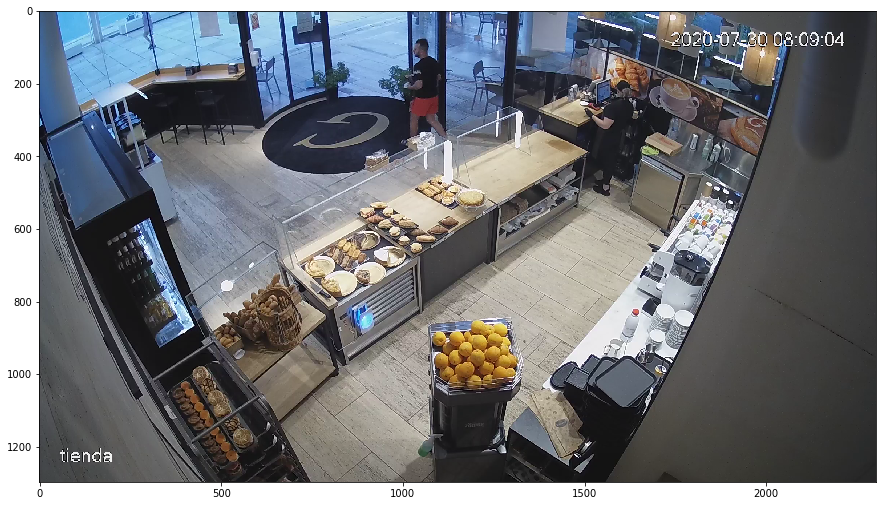

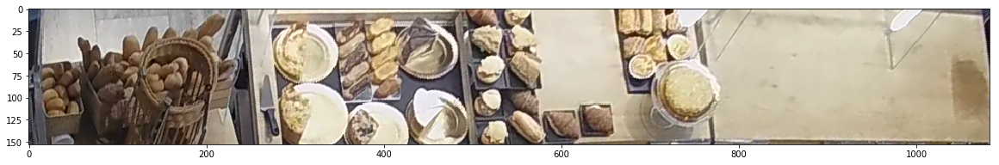

Frame: 9


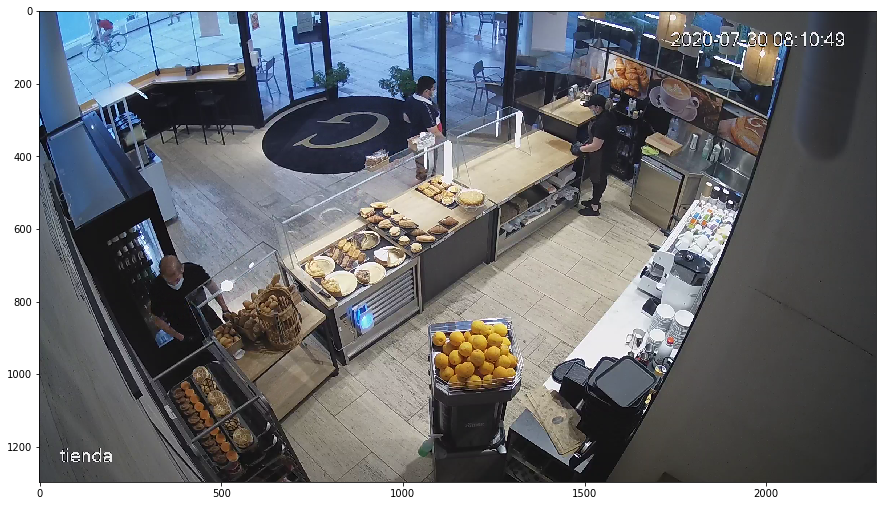

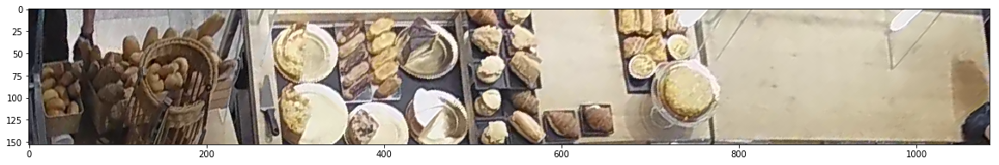

In [27]:
for idx, img in enumerate(frames):
    print(f'Frame: {idx}')
    plot_image(img, figsize=(15,15))
    img_crop, _ = extract_mostrador_imgs(img)
    plot_image(img_crop, figsize=(20,20))